
# **Lista 03 Processamento Digital de Imagens**
Professora: Mylene Farias

Monitores: André da Costa e Lucas Althoff

---

### Bibliotecas

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# Problema 1
Para esta questão, baixe as imagens baixo, utilizando-as para os problemas a seguir.

*   [imagem corrompida 01](https://drive.google.com/file/d/1Khm0oKhXMsYkOrQ-4Yj_1qZ_fz89WaFo/view?usp=sharing)
*   [imagem corrompida 02](https://drive.google.com/file/d/15-btecYUdm_30qcquGMoZiBrJPW1G2ky/view?usp=sharing)





**1.1.** 
A imagem  imagem corrompida 01 (disponibilizada no link acima) está degradada com ruído senoidal. Utilize a transformada de Fourier e o filtro rejeita-faixa Butterworth para recuperar esta imagem. 
Na sua solução mostre: 
- a imagem original e o seu espectro;
- o filtro rejeita-faixa projetado e o seu espectro;
- a imagem restaurada e o seu espectro.


In [2]:
def displayImagePath(path1, title1, title2='', path2='', figsize=(8, 12)):
    '''Função utilizada para fazer o display da imagem'''
    image1 = cv2.imread(path1)
    
    if path2 != '':
        image2 = cv2.imread(path2)
        
        fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=figsize)
        ax1.imshow(image1)
        ax1.axis('off')
        ax1.set_title(title1)
        
        ax2.imshow(image2)
        ax2.axis('off')
        ax2.set_title(title2)
        
        fig.tight_layout()
    else:
        plt.imshow(image1)
        plt.title(title1)
        plt.axis('off')
        
    plt.show()

In [3]:
def displayImage(image1, title1, title2='', image2='', figsize=(8, 12)):
    '''Função utilizada para fazer o display da imagem'''
    
    if image2 != '':      
        fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=figsize)
        ax1.imshow(image1, cmap = 'gray')
        ax1.axis('off')
        ax1.set_title(title1)
        
        ax2.imshow(image2, cmap = 'gray')
        ax2.axis('off')
        ax2.set_title(title2)
        
        fig.tight_layout()
    else:
        plt.imshow(image1, cmap = 'gray')
        plt.title(title1)
        plt.axis('off')
        
    plt.show()

Função criada para fazer o display de uma imagem e o seu respectivo espectro

In [4]:
def imageAndSpectrum(img_path, name, title1, title2, save_path):
        
    path2 = save_path + name
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    img_out = np.zeros(shape=(width, height), dtype='float64')
    
    fft = np.fft.fft2(img)
    fshift = np.fft.fftshift(fft)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    
    cv2.imwrite(save_path + name, magnitude_spectrum) 
    
    displayImagePath(img_path, title1, title2, path2)
    
    return fft
    

Imagem original e o seu espectro

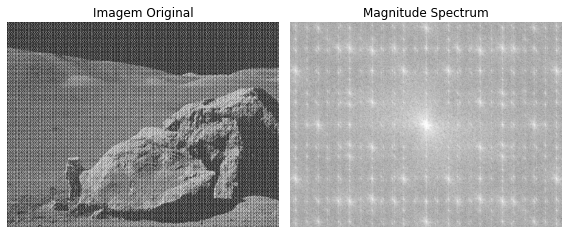

In [5]:
path = './corrompida.png'
name = 'Corrompida_Magnitude_Spectrum.png'
save_path = './images/Problema1/Questao1_1/'
title1 = 'Imagem Original'
title2 = 'Magnitude Spectrum'

_ = imageAndSpectrum(path, name, title1, title2, save_path)

O filtro rejeita-faixa projetado e o seu espectro e A imagem restaurada e o seu espectro.

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


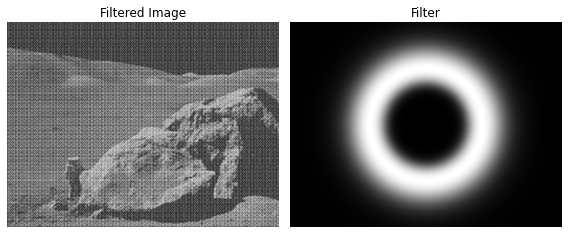

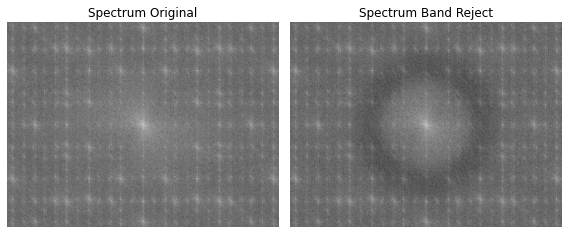

In [6]:
def butterworth_band_reject(img_path, D0, D1, n , display='y'): 
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(width, height))
    img_filtered = np.zeros(shape=(width, height), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    magnitude_spectrum = 20*np.log(np.abs(fftshift))
    
    H_LPD0 = np.zeros(shape=(height, width))
    H_LPD1 = np.zeros(shape=(height, width))
    H_HPD0 = np.zeros(shape=(height, width))
    H_BP = np.zeros(shape=(height, width))
    H_RB = np.zeros(shape=(height, width))
    filtered_img = np.zeros(shape=(height, width))
    
    k = 0
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            H_LPD0[i, j] = 1.0/(1.0 + math.pow(dist/D0, 2*n))
            H_LPD1[i, j] = 1.0/(1.0 + math.pow(dist/D1, 2*n))
            H_HPD0[i, j] = 1.0 - H_LPD0[i, j]
            H_BP[i,j] = H_HPD0[i,j]*H_LPD1[i,j]
            H_RB[i,j] = 1 - H_BP[i,j]
    
    img_filtered = fftshift*H_RB
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    
        
    fft = np.fft.fft2(np.uint8(img_filtered))
    fftshift = np.fft.fftshift(fft)
    magnitude_spectrum_res = 20*np.log(np.abs(fftshift))
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Filter', H_BP)
        displayImage(magnitude_spectrum, 'Spectrum Original', 
                     'Spectrum Band Reject', magnitude_spectrum_res)
    
    return img_filtered
    

path = './corrompida.png'
D0 = 100
D1 = 70 + D0
n = 5

_ = butterworth_band_reject(path, D0, D1, n)

Pode-se tentar corrigir a imagem corrompida com um filtro passa baixas Gaussiano, Butterworth e ideal.

In [7]:
def idealLowPassFilter(img_path, D0, display='y'):
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            if dist <= D0:
                ideal_filter[i, j] = 1
            else:
                ideal_filter[i, j] = 0
                
    img_filtered = fftshift*ideal_filter
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Ideal Filter', ideal_filter)
    
    return img_filtered
        
    

In [8]:
def lowPassGaussian(img_path, D0, display='y'):
    
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    filter_gau = np.zeros(shape=(height, width))
    filtered_img = np.zeros(shape=(height, width))
    
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            filter_gau[i,j] = math.e**(-(dist**2)/(2*(D0)**2))
    
    img_filtered = fftshift*filter_gau
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Filter', filter_gau)
    
    return img_filtered

In [9]:
def butterworth_LowPass(img_path, D0, n , display='y'): 
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    H_LPD0 = np.zeros(shape=(height, width))
    H_LPD1 = np.zeros(shape=(height, width))
    H_HPD1 = np.zeros(shape=(height, width))
    H_BP = np.zeros(shape=(height, width))
    H_RB = np.zeros(shape=(height, width))
    filtered_img = np.zeros(shape=(height, width))
    
    k = 0
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            H_LPD0[i, j] = 1.0/(1.0 + math.pow(dist/D0, 2*n))
    
    img_filtered = fftshift*H_LPD0
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Filter', H_LPD0)
    
    return img_filtered
    



/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


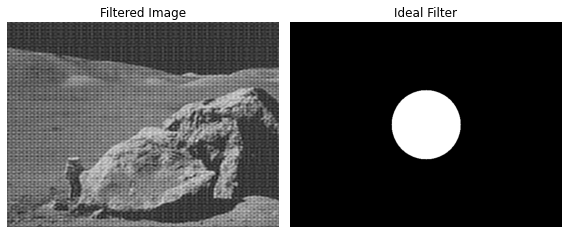

In [10]:
_ = idealLowPassFilter('./corrompida.png', 80, display='y')

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


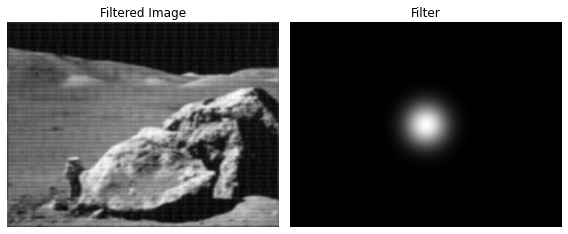

In [11]:
_ = lowPassGaussian('./corrompida.png', 33, display='y')

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


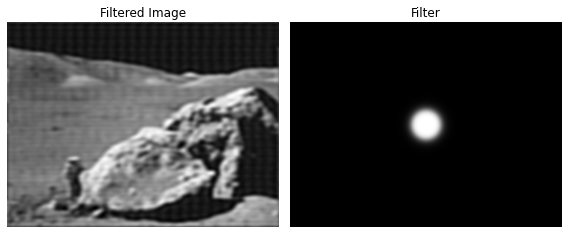

In [12]:
path = './corrompida.png'
n = 4
_ = butterworth_LowPass(path, 35, n)

**1.2**
A imagem corrompida 02 é primeira imagem do planeta terra tirada do espaço (23 de agosto de 1966). Observe que a imagem está corrompida por um ruído periódico. Da mesma forma que no exemplo anterior, utilize a transformada de Fourier e um filtro de sua escolha para eliminar o ruído. Na sua solução mostre:

- a imagem original e o seu espectro;
- o filtro rejeita-faixa projetado e o seu espectro;
- a imagem restaurada e o seu espectro;
- o ruído e o seu espectro.  

Imagem original e o seu espectro

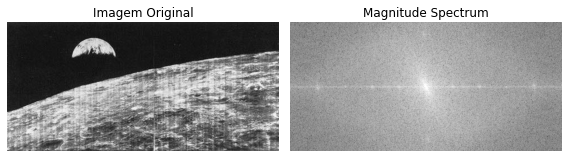

In [13]:
path = './first_view_of_earth_from_space_credit_nasa.jpg'
name = 'Earth_First_View_Spectrum.jpg'
save_path = './images/Problema1/Questao1_2/'
title1 = 'Imagem Original'
title2 = 'Magnitude Spectrum'

_ = imageAndSpectrum(path, name, title1, title2, save_path)

O filtro rejeita-faixa projetado e o seu espectro e A imagem restaurada e o seu espectro.

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


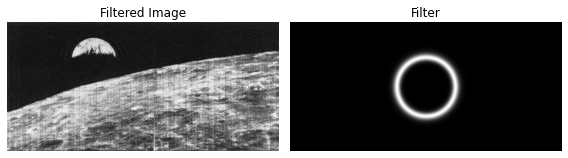

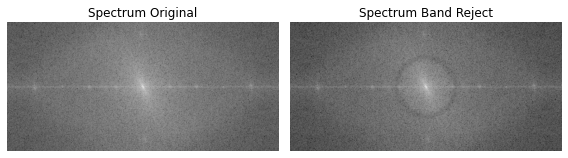

In [14]:
path = './first_view_of_earth_from_space_credit_nasa.jpg'
D0 = 50
D1 = 5 + D0
n = 10

_ = butterworth_band_reject(path, D0, D1, n)

O ruído e o seu espectro

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: overflow encountered in ubyte_scalars
  del sys.path[0]
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


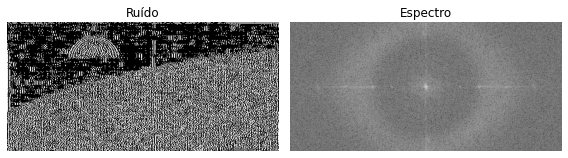

In [15]:
def getRuido(img_path):
    D0 = 100
    D1 = 70 + D0
    n = 5

    img1 = cv2.imread(img_path, 0)
    img2 = butterworth_band_reject(img_path, D0, D1, n, 'n')
    height, width = img1.shape
    res = np.zeros(shape=(height, width))
    
    for i in range(height):
        for j in range(width):
            res[i, j] = abs(img1[i, j] - img2[i, j])
            if res[i, j] < 0: res[i, j] = 0
            elif res[i, j] > 255: res[i, j] = 255
            

    fft = np.fft.fft2(np.uint8(res))
    fftshift = np.fft.fftshift(fft)
    magnitude_spectrum_res = 20*np.log(np.abs(fftshift))
    
    displayImage(res, 'Ruído', 'Espectro', magnitude_spectrum_res)
    return img1 - img2

_ = getRuido('./first_view_of_earth_from_space_credit_nasa.jpg')

## **Problema 2**

Nesta questão, utilize uma das imagens abaixo:
- [Barbara](https://homepages.cae.wisc.edu/~ece533/images/barbara.png)
- [Lena](https://homepages.cae.wisc.edu/~ece533/images/lena.png)
- [Zelda](https://homepages.cae.wisc.edu/~ece533/images/zelda.png)

**Obs**: Não se esqueça de transformar as respectivas imagens para escala de cinza dessas imagens, caso necessário for.

**2.1**  Projete os seguintes filtros no domínio da frequência:
- passa-baixas ideal;
- passa-baixas Gaussiano;
- passa-baixas Butterworth.

Filtre (no domínio da frequência) as imagens Barbara, Lena e Zelda. Imprima as imagens para visualização.


Filtro Passa-Baixas Ideal

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


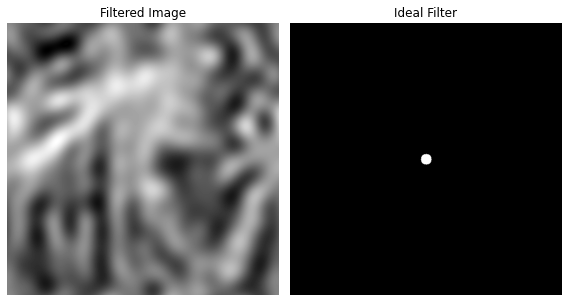

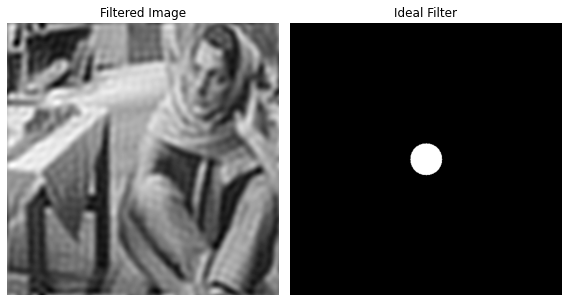

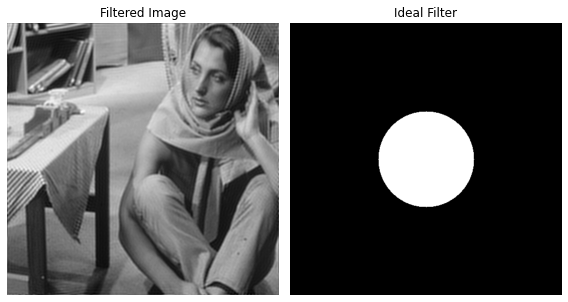

In [16]:
_ = idealLowPassFilter('./barbara.png', 10)  
_ = idealLowPassFilter('./barbara.png', 30)  
_ = idealLowPassFilter('./barbara.png', 90)  

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


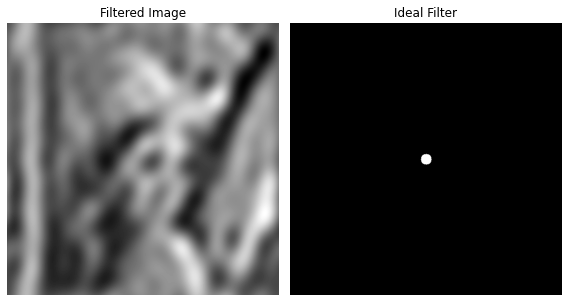

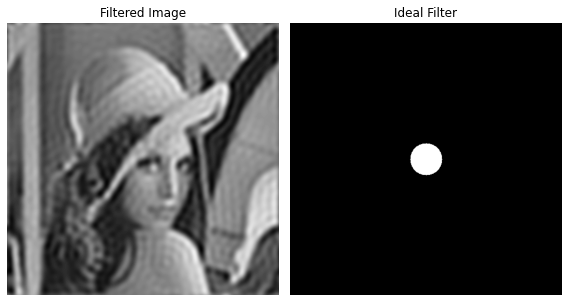

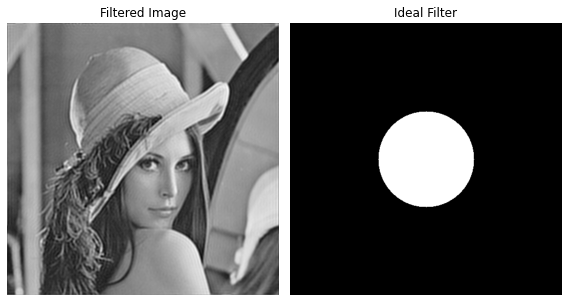

In [17]:
_ = idealLowPassFilter('./lena.png', 10) 
_ = idealLowPassFilter('./lena.png', 30) 
_ = idealLowPassFilter('./lena.png', 90) 

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


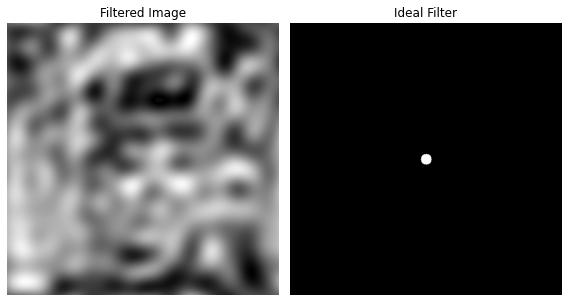

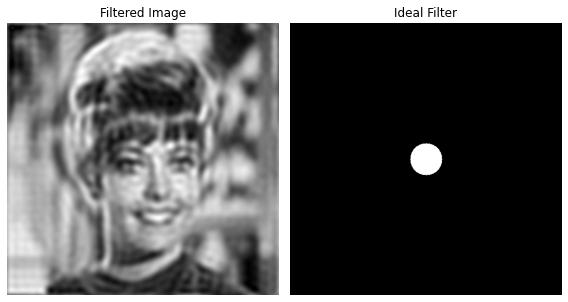

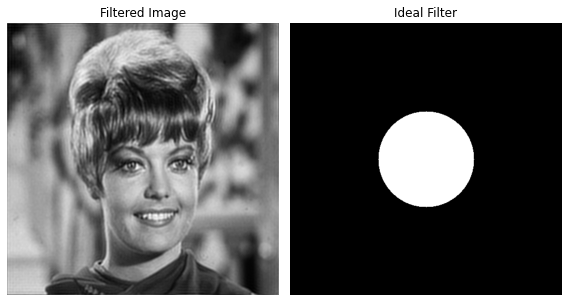

In [18]:
_ = idealLowPassFilter('./zelda.png', 10) 
_ = idealLowPassFilter('./zelda.png', 30) 
_ = idealLowPassFilter('./zelda.png', 90) 

Filtro Passa Baixas Gaussiano

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


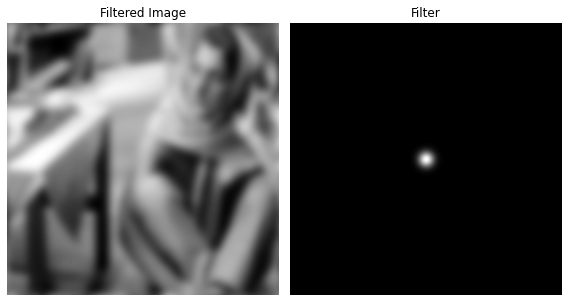

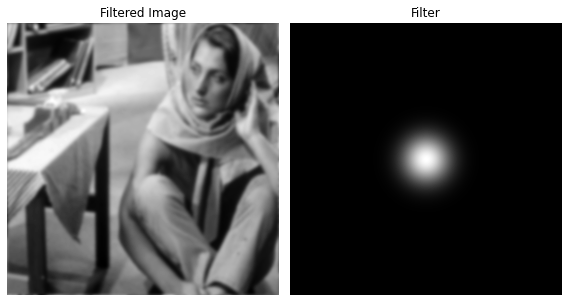

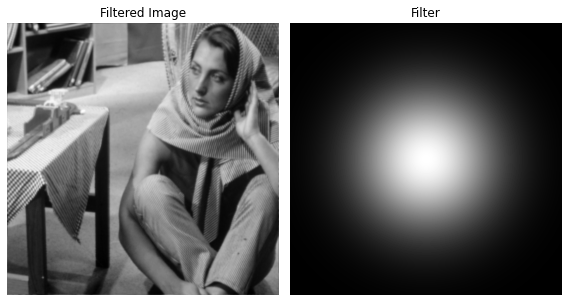

In [19]:
_ = lowPassGaussian('./barbara.png', 10)
_ = lowPassGaussian('./barbara.png', 30)
_ = lowPassGaussian('./barbara.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


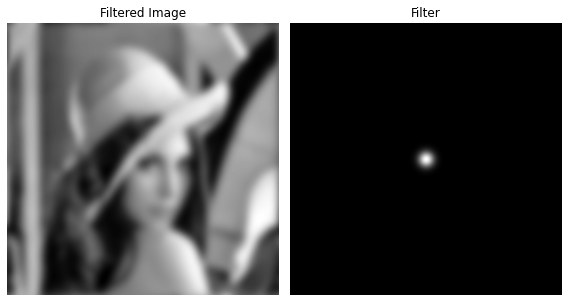

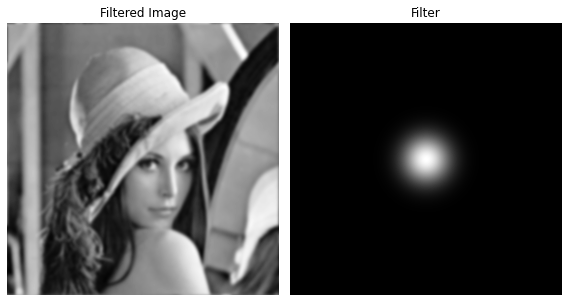

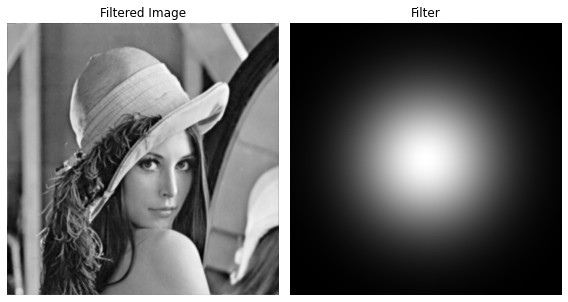

In [20]:
_ = lowPassGaussian('./lena.png', 10)
_ = lowPassGaussian('./lena.png', 30)
_ = lowPassGaussian('./lena.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


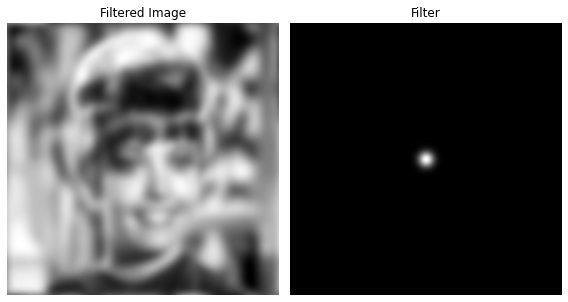

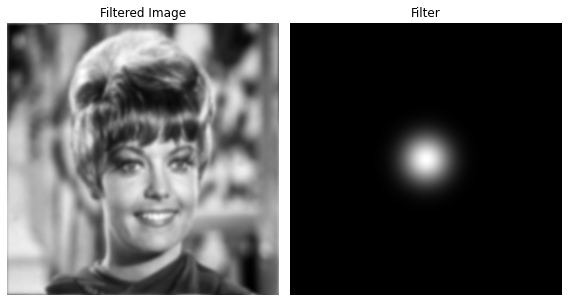

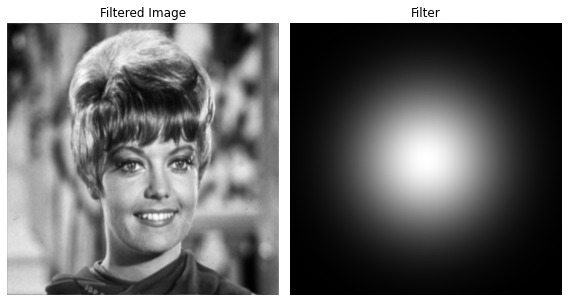

In [21]:
_ = lowPassGaussian('./zelda.png', 10)
_ = lowPassGaussian('./zelda.png', 30)
_ = lowPassGaussian('./zelda.png', 90)

Filtro Passa Baixas Butterworth

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


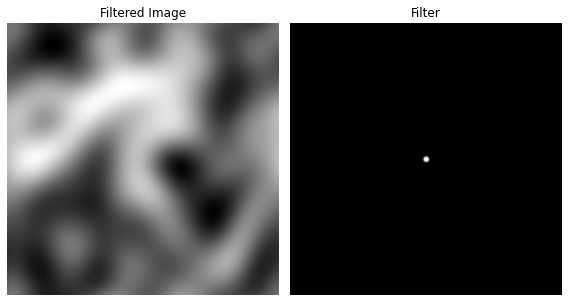

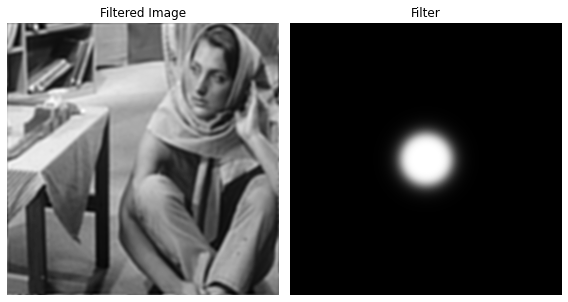

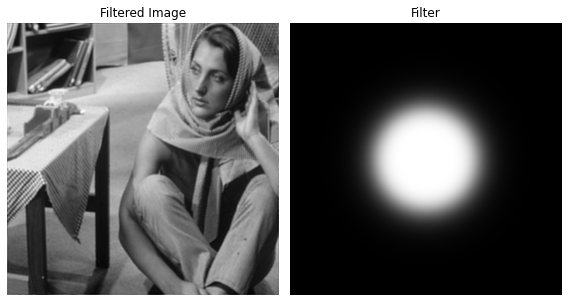

In [22]:
path = './barbara.png'
n = 4

_ = butterworth_LowPass(path, 5, n)
_ = butterworth_LowPass(path, 50, n)
_ = butterworth_LowPass(path, 100, n)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


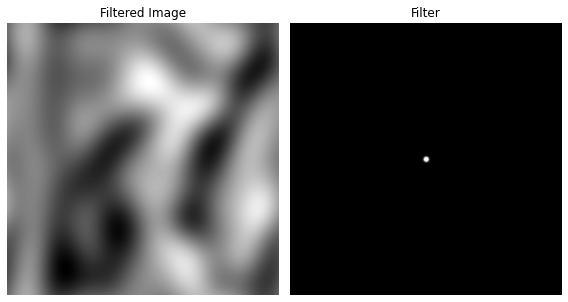

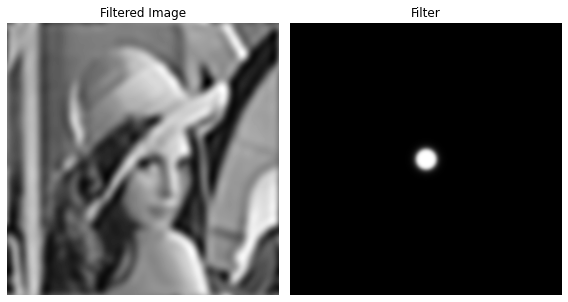

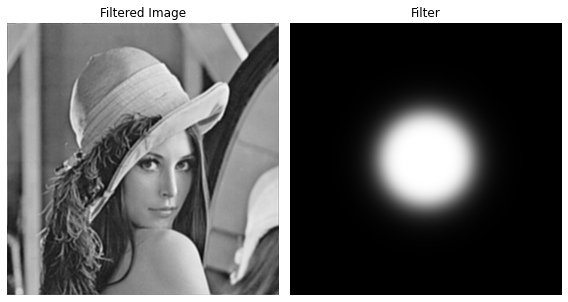

In [23]:
path = './lena.png'
n = 4
_ = butterworth_LowPass(path, 5, n)
_ = butterworth_LowPass(path, 20, n)
_ = butterworth_LowPass(path, 90, n)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


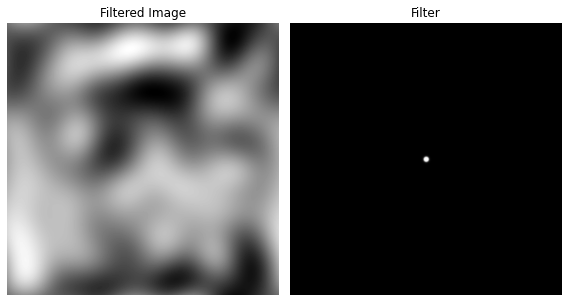

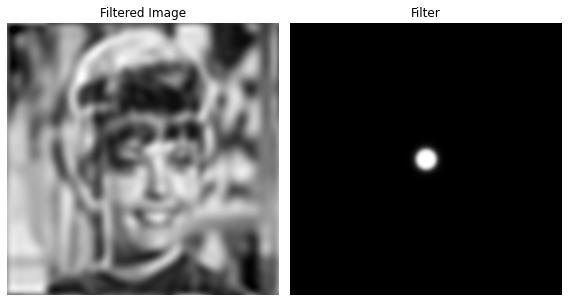

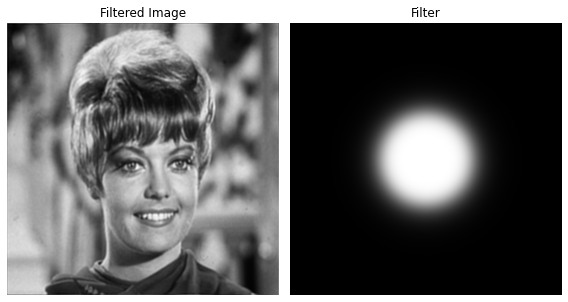

In [24]:
path = './zelda.png'
n = 4
_ = butterworth_LowPass(path, 5, n)
_ = butterworth_LowPass(path, 20, n)
_ = butterworth_LowPass(path, 90, n)

**2.2** Utilizando os filtros passa-baixas projetados na questão 2.1, obtenha os **filtros** **passa-alta** correspondentes e filtre (no domínio da frequência) as imagens Barbara, Lena e Zelda. Imprima as imagens para visualização.

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


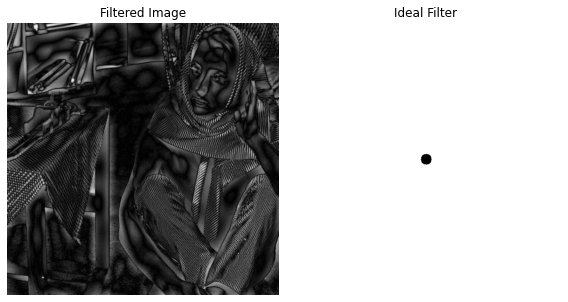

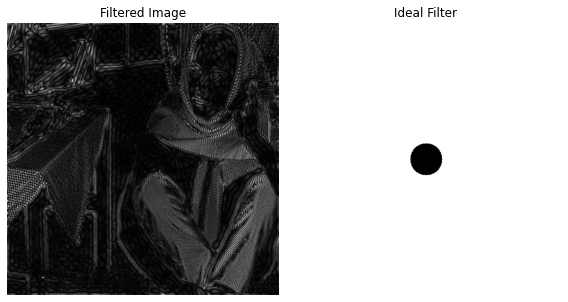

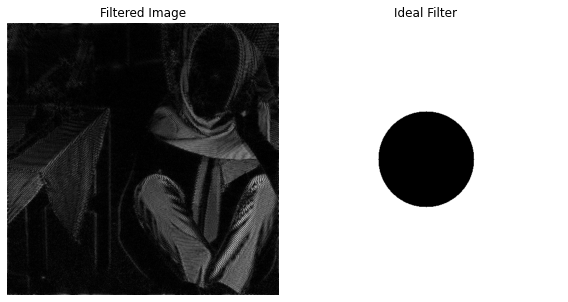

In [25]:
def idealHighPassFilter(img_path, D0, display='y'):
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            if dist <= D0:
                ideal_filter[i, j] = 0
            else:
                ideal_filter[i, j] = 1
                
    img_filtered = fftshift*ideal_filter
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Ideal Filter', ideal_filter)
    
    return img_filtered
        
    
_ = idealHighPassFilter('./barbara.png', 10)  
_ = idealHighPassFilter('./barbara.png', 30)  
_ = idealHighPassFilter('./barbara.png', 90)  

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


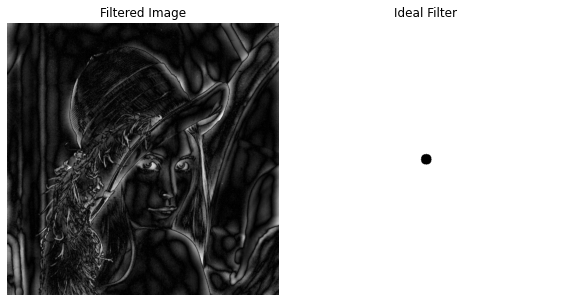

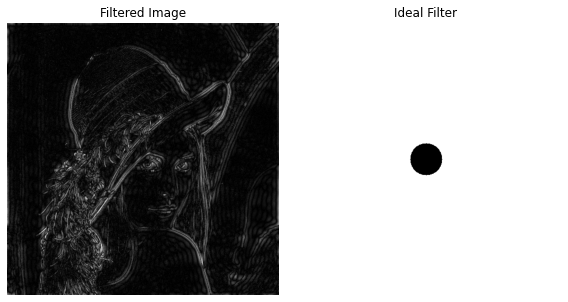

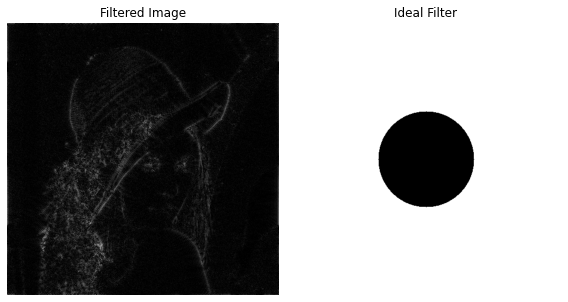

In [26]:
_ = idealHighPassFilter('./lena.png', 10)
_ = idealHighPassFilter('./lena.png', 30)
_ = idealHighPassFilter('./lena.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


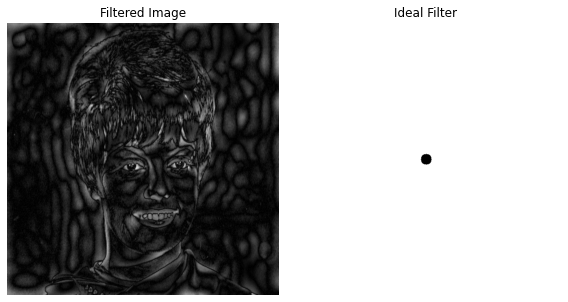

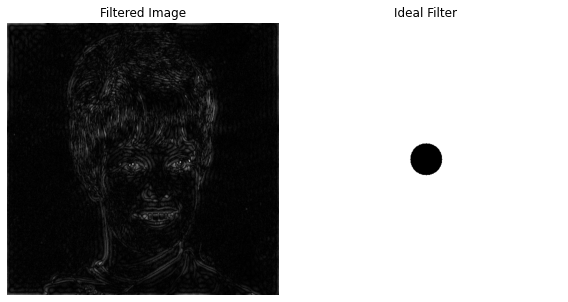

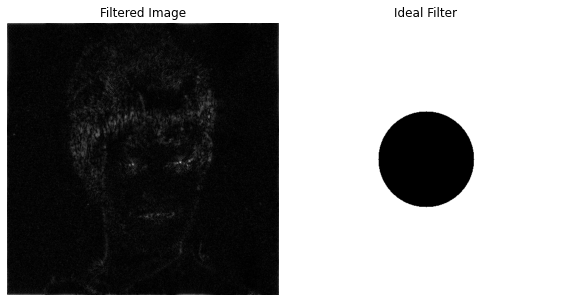

In [27]:
_ = idealHighPassFilter('./zelda.png', 10)
_ = idealHighPassFilter('./zelda.png', 30)
_ = idealHighPassFilter('./zelda.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


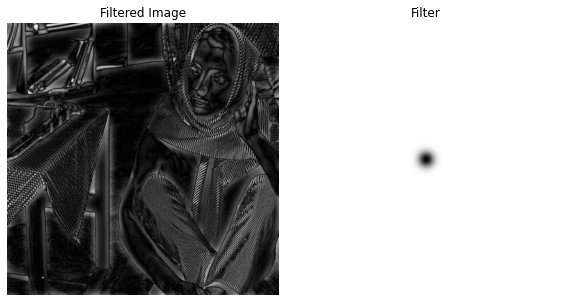

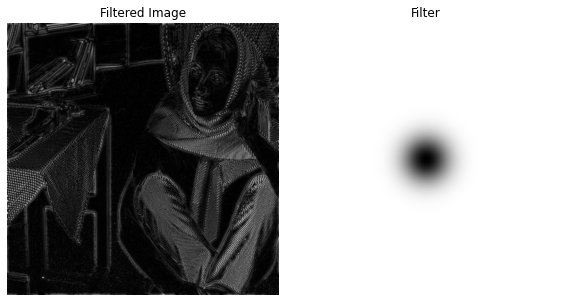

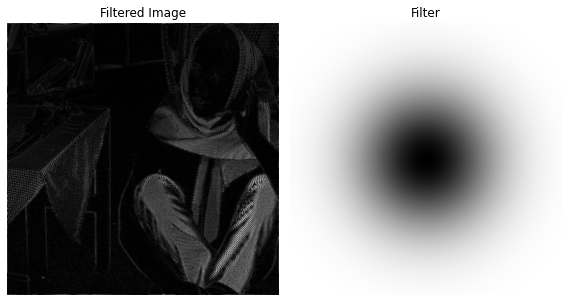

In [28]:
def highPassGaussian(img_path, D0, display='y'):
    
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    filter_gau = np.zeros(shape=(height, width))
    filtered_img = np.zeros(shape=(height, width))
    
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            filter_gau[i,j] = 1 - math.e**(-(dist**2)/(2*(D0)**2))
    
    img_filtered = fftshift*filter_gau
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Filter', filter_gau)
    
    return img_filtered
            
_ = highPassGaussian('./barbara.png', 10)
_ = highPassGaussian('./barbara.png', 30)
_ = highPassGaussian('./barbara.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


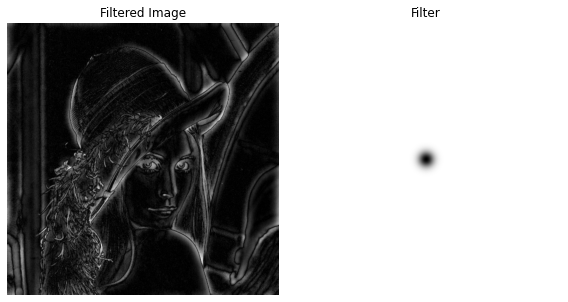

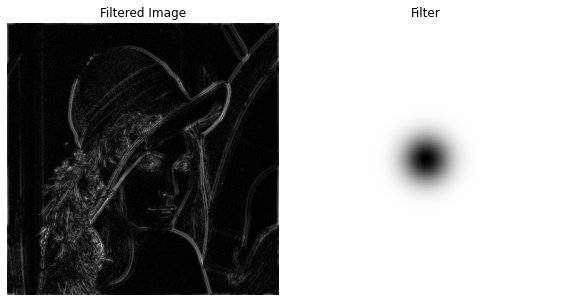

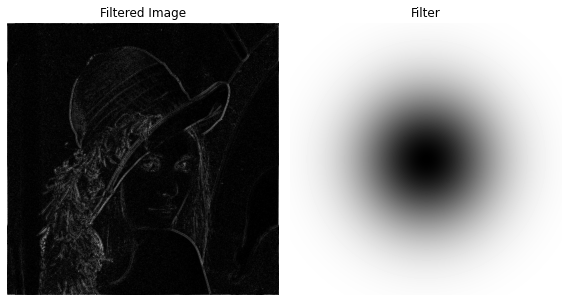

In [29]:
_ = highPassGaussian('./lena.png', 10)
_ = highPassGaussian('./lena.png', 30)
_ = highPassGaussian('./lena.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


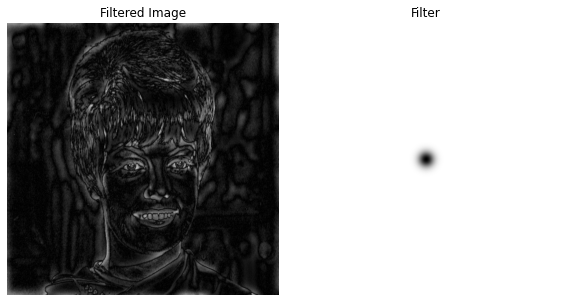

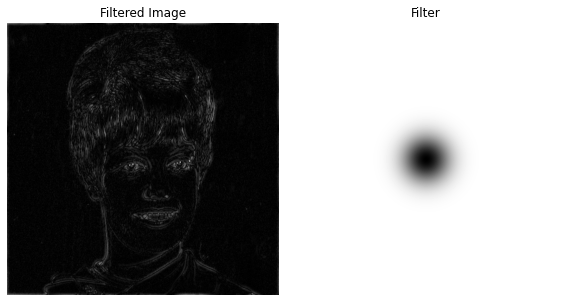

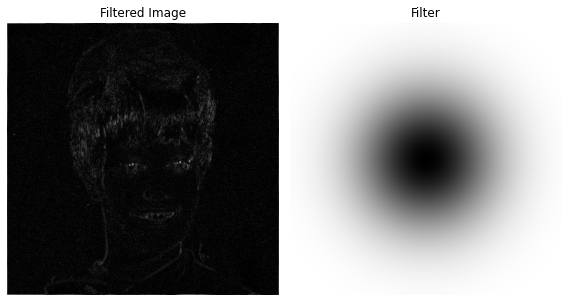

In [30]:
_ = highPassGaussian('./zelda.png', 10)
_ = highPassGaussian('./zelda.png', 30)
_ = highPassGaussian('./zelda.png', 90)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


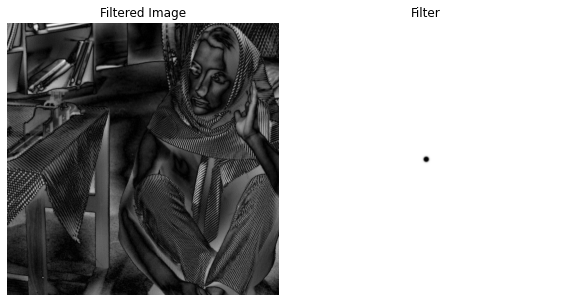

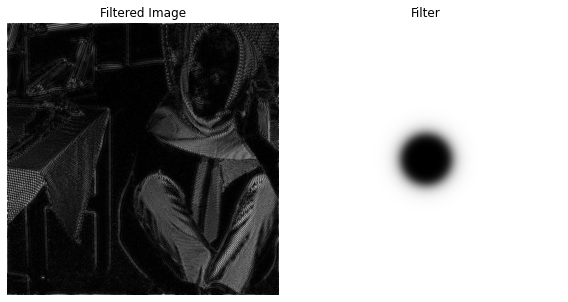

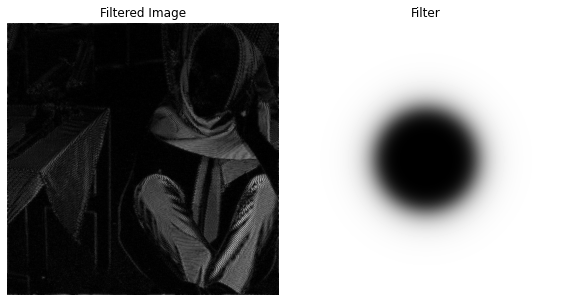

In [31]:
def butterworth_HighPass(img_path, D0, n , display='y'): 
    import math
    
    img = cv2.imread(img_path, 0)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    ideal_filter = np.zeros(shape=(height, width))
    img_filtered = np.zeros(shape=(height, width), dtype=np.complex)
    
    fft = np.fft.fft2(np.uint8(img))
    fftshift = np.fft.fftshift(fft)
    
    H_LPD0 = np.zeros(shape=(height, width))
    H_LPD1 = np.zeros(shape=(height, width))
    H_HPD1 = np.zeros(shape=(height, width))
    H_BP = np.zeros(shape=(height, width))
    H_RB = np.zeros(shape=(height, width))
    filtered_img = np.zeros(shape=(height, width))
    
    k = 0
    for i in range(height):
        for j in range(width):
            dist = math.sqrt( (i-height/2)**2 + (j-width/2)**2 )
            H_LPD0[i, j] = 1 - 1.0/(1.0 + math.pow(dist/D0, 2*n))
    
    img_filtered = fftshift*H_LPD0
    img_filtered = np.fft.ifftshift(img_filtered)
    img_filtered = np.fft.ifft2(img_filtered)
    img_filtered = np.abs(np.real(img_filtered))
    img_filtered = np.uint8(img_filtered)
    
    if display == 'y':
        displayImage(img_filtered, 'Filtered Image', 'Filter', H_LPD0)
    
    return img_filtered
    

path = './barbara.png'
n = 4

_ = butterworth_HighPass(path, 5, n)
_ = butterworth_HighPass(path, 50, n)
_ = butterworth_HighPass(path, 100, n)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


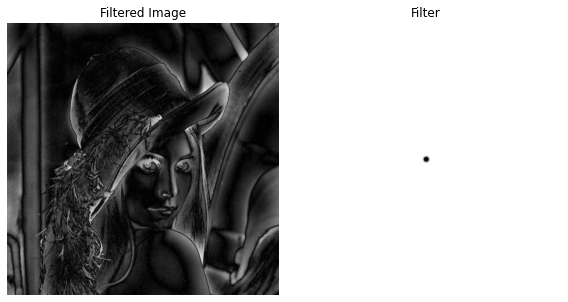

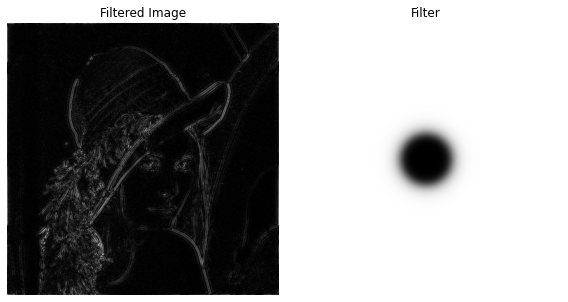

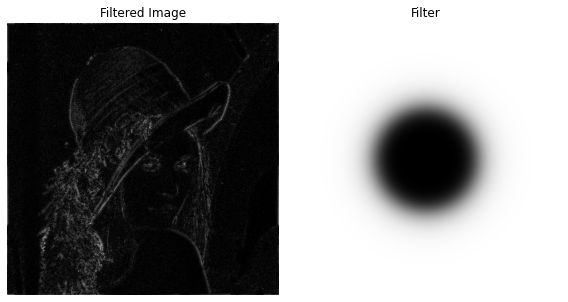

In [32]:
n = 4.0
path = './lena.png'
_ = butterworth_HighPass(path, 5, n)
_ = butterworth_HighPass(path, 50, n)
_ = butterworth_HighPass(path, 100, n)

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


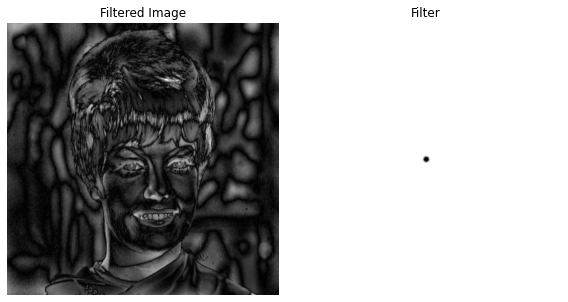

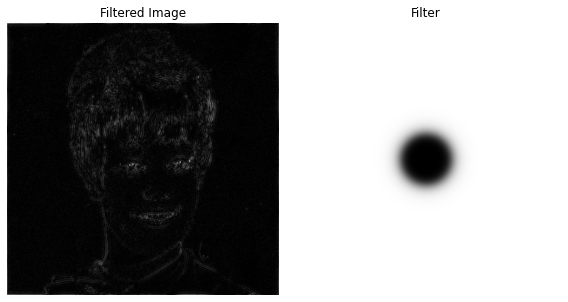

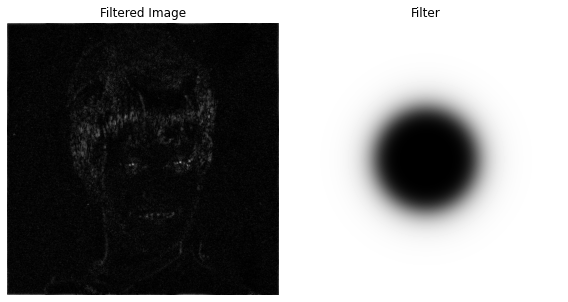

In [33]:
n = 4.0
path = './zelda.png'
_ = butterworth_HighPass(path, 5, n)
_ = butterworth_HighPass(path, 50, n)
_ = butterworth_HighPass(path, 100, n)

**2.3** Utilize os filtros passa-baixas e passa-altas projetados para implementar a técnica de máscara de nitidez (unsharp masking) e a técnica high boost no domínio da frequência. 

Considerando as três imagens acima, teste o algoritmos para k = 1 (máscara de nitidez) e para pelo menos 5 valores de k > 1, comentando sobre os diversos resultados.


Unsharp Masking

In [34]:
def unsharpMask(img_path, D0, display='y'):
    img = cv2.imread(img_path,0) 
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    unsharp = np.zeros((height, width), np.int32)

    img_blur = lowPassGaussian(img_path, D0, 'n')
    
    for i in range(height):
        for j in range(width):
            unsharp[i, j] = int(img[i, j]) - img_blur[i, j]
            if unsharp[i, j] > 255: unsharp[i, j] = 255
            if unsharp[i, j] < 0: unsharp[i, j] = 0
    
    if display=='y':
        displayImage(unsharp, 'Unsharp')
        
    return unsharp

HighBoost

In [35]:
def highBoost(img_path, k, D0):
    img = cv2.imread(img_path,0) 
    height, width = img.shape

    unsharp = unsharpMask(img_path, D0, 'n')
    img_highboost = np.zeros((height, width), np.uint32)

    for i in range(height):
        for j in range(width):
            img_highboost[i, j] = round(img[i, j] + k*unsharp[i, j])
            if img_highboost[i, j] > 255: img_highboost[i, j] = 255
            if img_highboost[i, j] < 0: img_highboost[i, j] = 0

    displayImage(img_highboost, 'k = {}'.format(k), 'Original Image', img)

Barbara

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


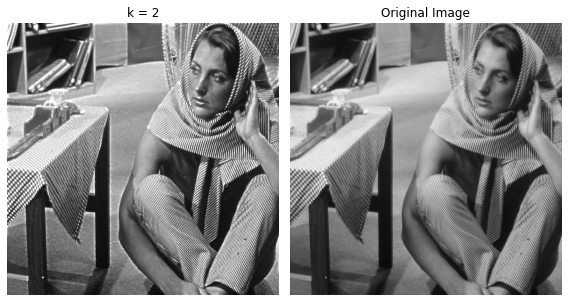

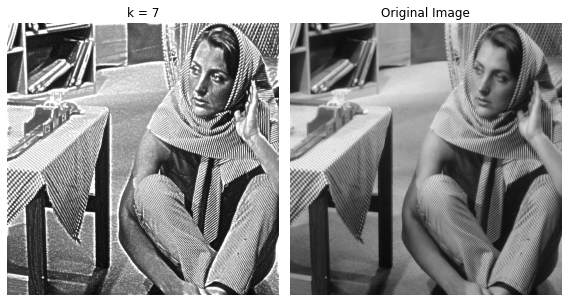

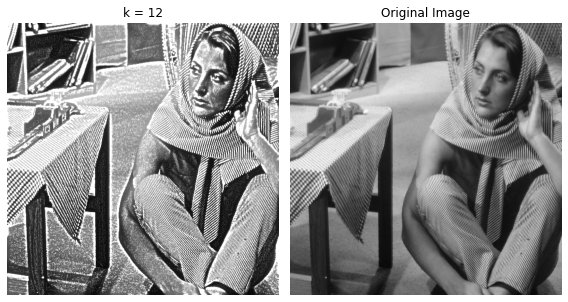

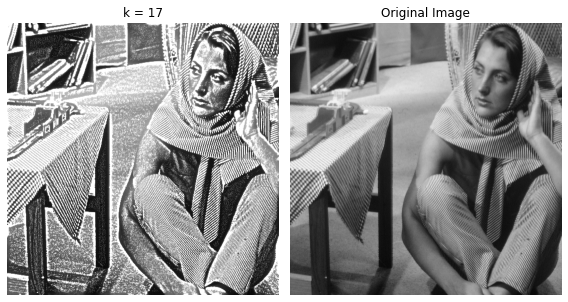

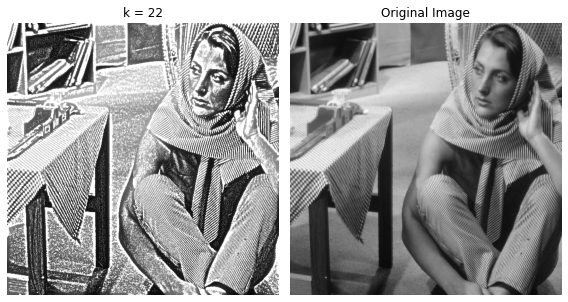

In [39]:
img_path = "./barbara.png"
for k in range(2, 25, 5):
    highBoost(img_path, k, 30)

Lena

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


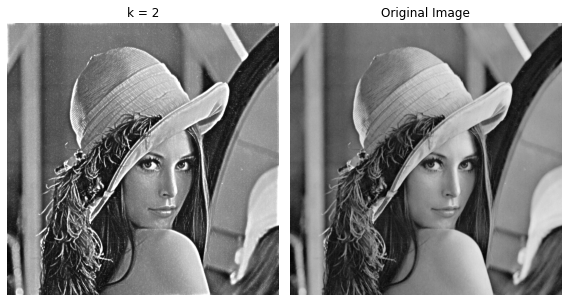

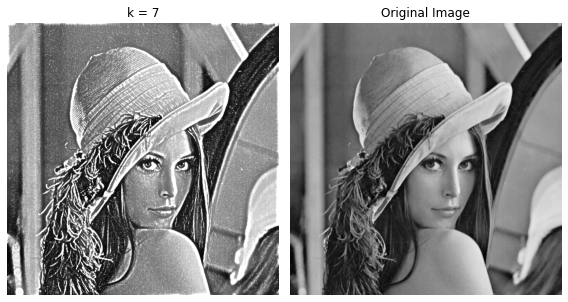

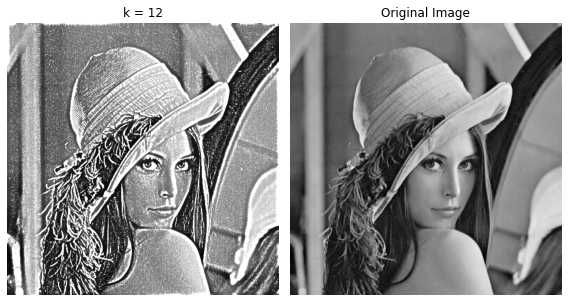

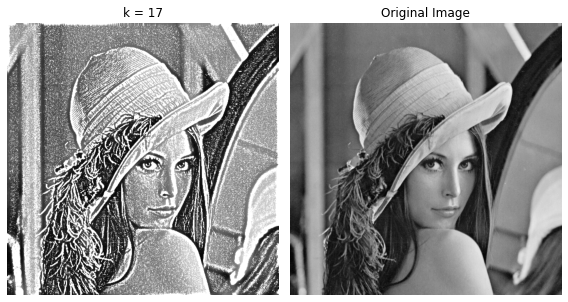

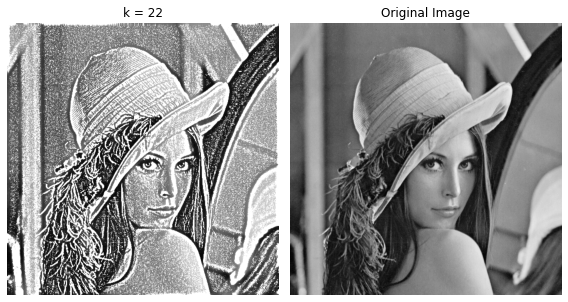

In [40]:
img_path = "./lena.png"
for k in range(2, 25, 5):
    highBoost(img_path, k, 30)

Zelda

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista3/venv_lista3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


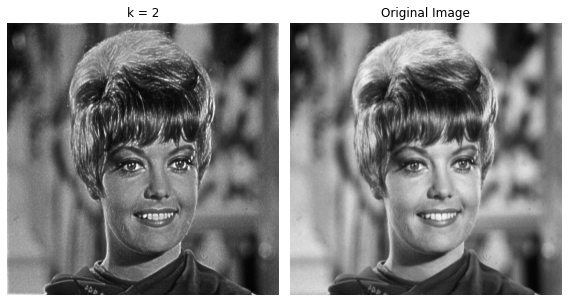

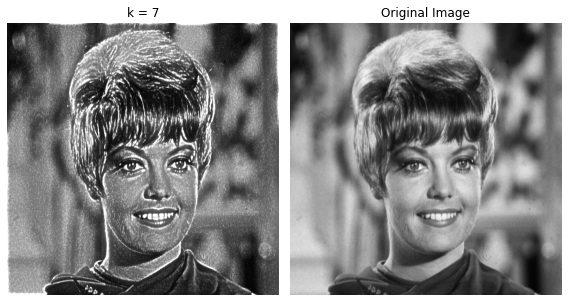

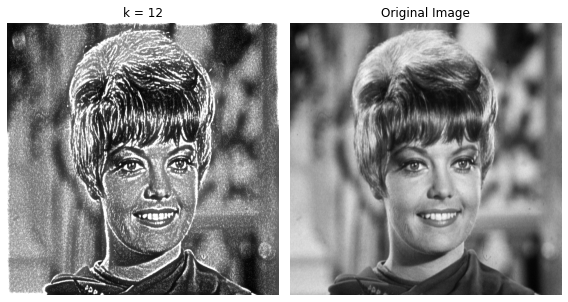

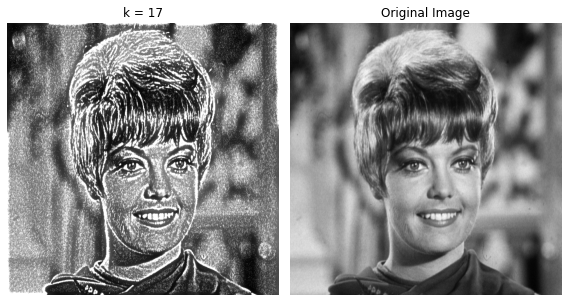

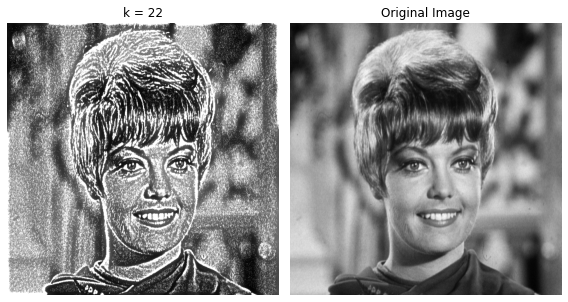

In [41]:
img_path = "./zelda.png"
for k in range(2, 25, 5):
    highBoost(img_path, k, 30)

Como explicado no próprio livro, "Observe that negativa values were added to the original image. Thus, it is possible for the final result to have negative intensities if the original image has any zero values, or if the value k is chosen large enought to emphasize the peaks of the mask to a level larger than the minimun value in the original signal". Assim é posível ver que as imagens obtiveram aumento conforme aumentou-se K.